In [18]:
# Import necessary libraries
import os, warnings
from tensorflow.keras.utils import image_dataset_from_directory
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Activation
from tensorflow.keras.applications import VGG16, MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import datetime

# Project 2 - Veggie Classification

For this assignment you'll need to classify some images of vegetables.

## Parts

Please do two separate classifications:
<ol>
<li> First, create a model from scratch.
<li> Use transfer learning to use a pretrained model of your choice, adapted to this data.
</ol>

There won't be an explicit evaluation of accuracy, but you should take some steps to make each model as accurate as you reasonably can, any tuning option is fair game. Along with that, please structure it into a notebook that is well structured and clear that explains what you did and found. Think about:
<ul>
<li> Sections and headings.
<li> A description of the approach taken (e.g. what did you do to determine size, tune, evaluate, etc...)
<li> Visualization of some important things such as a confusion matrix and maybe some images.
<li> Results, mainly focused on the scoring of the test data.
</ul>

The descriptions and explainations should highlight the choices you made and why you made them. Figure up to about a page or so worth of text total, explain what happened but don't write an essay.

## Deliverables

Please sumbmit a link to your github, where everyhting is fully run with all the outputs showing on the page. As well, in the notebook please add some kind of switch controlled by a variable that will control if the notebook runs to train the model or to load the model in from weights - so I can download it and click run all, it will load the saved weights, and predict.

### Dataset

The code in the start of this notebook will download and unzip the dataset, and there is also a simple example of creating datasets. You can change the dataset bit to use a different approach if you'd like. The data is already split into train, validation, and test sets. Please treat the separate test set as the final test set, and don't use it for any training or validation. Each folder name is its own label.

### Evaluation

Marking will be based on the following:
<ul>
<li> Models are cretaed, tuned, and effective at classifying the data: 40%
<li> Descriptions and explanations of the approach taken: 20%
<li> Code is well structured and clear: 20%
</ul>

Overall the marking is pretty simple and direct, walk through the process of predicting the veggies, explain what you did, and show the results. If you do that, it'll get a good mark.

### Tips

Some hints that may be helpful to keep in mind:
<ul>
<li> The data is pretty large, so you'll want to use datasets rather than load everything into memory. The Keras docs have a few examples of different ways to load image data, our examples showed image generators and the image from directory datasets.  
<li> Be careful of batch size, you may hit the colab limits.
<li> You'll want to use checkpoints so you can let it train and pick up where you left off.
<li> When developing, using a smaller dataset sample is a good idea. These weights could also be saved and loaded to jump start training on the full data.
<li>

In [2]:
pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=8cfded0237a441f654e1c8532b8d1bf7c2bd3f759d9632bc93697d0c7814ad8c
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [3]:
def bar_custom(current, total, width=80):
    print("Downloading: %d%% [%d / %d] bytes" % (current / total * 100, current, total))
import wget
import zipfile
zip_name = "train.zip"

url = "https://jrssbcrsefilesnait.blob.core.windows.net/3950data1/vegetable_image_dataset.zip"

if not os.path.exists(zip_name):
    wget.download(url, zip_name, bar=bar_custom)

with zipfile.ZipFile(zip_name, 'r') as zip_ref:
    zip_ref.extractall()

Streaming output truncated to the last 5000 lines.
Downloading: 92% [519086080 / 560031432] bytes
Downloading: 92% [519094272 / 560031432] bytes
Downloading: 92% [519102464 / 560031432] bytes
Downloading: 92% [519110656 / 560031432] bytes
Downloading: 92% [519118848 / 560031432] bytes
Downloading: 92% [519127040 / 560031432] bytes
Downloading: 92% [519135232 / 560031432] bytes
Downloading: 92% [519143424 / 560031432] bytes
Downloading: 92% [519151616 / 560031432] bytes
Downloading: 92% [519159808 / 560031432] bytes
Downloading: 92% [519168000 / 560031432] bytes
Downloading: 92% [519176192 / 560031432] bytes
Downloading: 92% [519184384 / 560031432] bytes
Downloading: 92% [519192576 / 560031432] bytes
Downloading: 92% [519200768 / 560031432] bytes
Downloading: 92% [519208960 / 560031432] bytes
Downloading: 92% [519217152 / 560031432] bytes
Downloading: 92% [519225344 / 560031432] bytes
Downloading: 92% [519233536 / 560031432] bytes
Downloading: 92% [519241728 / 560031432] bytes
Downloadi

In [4]:
# ENSURE FILE PATHS MATCH CORRECTLY
IMAGE_SIZE=(224,224)
train_dir='Vegetable Images/train'
val_dir='Vegetable Images/validation'
batch_size = 96

# Load training data
train_ds = image_dataset_from_directory(
    train_dir,
    label_mode='categorical',
    image_size = IMAGE_SIZE,
    batch_size=batch_size
)
# Load validation data
val_ds = image_dataset_from_directory(
    val_dir,
    label_mode='categorical',
    image_size = IMAGE_SIZE,
    batch_size = batch_size,
)

Found 15000 files belonging to 15 classes.
Found 3000 files belonging to 15 classes.


## Data Preparation

In this section, we load and preprocess our data, apply data augmentation, and split it into training, validation, and test sets.

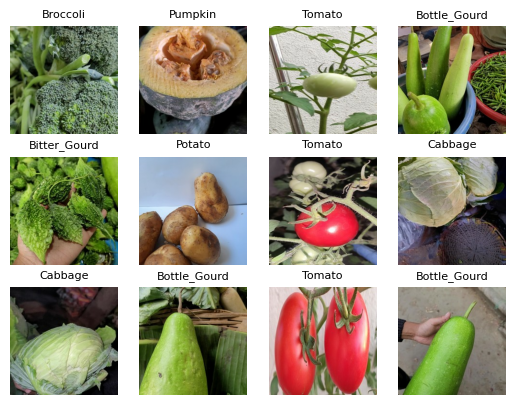

In [5]:
# Visualizing a batch of images from the training dataset
class_names = train_ds.class_names
num_of_classes = len(train_ds.class_names)

for image_batch, label_batch in train_ds.take(1):
    for i in range(12):  # Taking 12 images
        ax = plt.subplot(3, 4, i + 1)  # 3 by 4 shape
        plt.imshow(image_batch[i].numpy().astype("uint8"))

        # Convert label index to class name
        class_name = class_names[tf.argmax(label_batch[i])]
        plt.title(class_name, fontsize = 8)
        plt.axis("off")

In [6]:
# Data augmentation pipeline
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
])

## Custom Model



In [7]:
# Define the custom model
def define_custom_model():
    model = Sequential([
        tf.keras.layers.Input(shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3)),
        data_augmentation,
        tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'),
        tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'),
        tf.keras.layers.MaxPooling2D(pool_size=2, strides=2),
        tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu'),
        tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu'),
        tf.keras.layers.MaxPooling2D(pool_size=2, strides=2),
        tf.keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu'),  # Additional Conv2D Layer
        tf.keras.layers.BatchNormalization(),  # Batch Normalization Layer
        tf.keras.layers.GlobalAveragePooling2D(),  # Global Average Pooling Layer
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=512, activation='relu'),
        tf.keras.layers.Dense(units=512, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(units=len(train_ds.class_names), activation='softmax')
    ])
    return model


## Transfer Learning Model

In [8]:
# Define the transfer learning model
def define_transfer_learning_model():
    pretrained_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')  # Load pre-trained model
    pretrained_model.trainable = False # Freeze the layers
    model = Sequential([ # Create transfer learning model
        pretrained_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(len(train_ds.class_names), activation='softmax')
    ])
    return model


## Compiling Models

In [9]:
# Compile the custom model
custom_model = define_custom_model()
custom_model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=['accuracy'])
custom_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 64)      36928     
                                                      

In [10]:
# Compile the transfer learning model
transfer_learning_model = define_transfer_learning_model()
transfer_learning_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
transfer_learning_model.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_3 (Dense)             (None, 15)                19215     
                                                                 
Total params: 2277199 (8.69 MB)
Trainable params: 19215 (75.06 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


## Monitoring Training with TensorBoard

In [11]:
#Setting up timestamped log directories
log_dir_custom = "logs/custom_model/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir_transfer = "logs/transfer_model/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [12]:
#Creating TensorBoard callbacks
tensorboard_callback_custom = TensorBoard(log_dir=log_dir_custom, histogram_freq=1)
tensorboard_callback_transfer = TensorBoard(log_dir=log_dir_transfer, histogram_freq=1)

## Model Training or Loading Weights

In [13]:
# Switch for Model Training or Loading Weights
LOAD_WEIGHTS = False  # True to load weights instead of training

if LOAD_WEIGHTS:
    #Weights for both models
    custom_model.load_weights('custom_model_weights.h5')
    transfer_learning_model.load_weights('transfer_learning_model_weights.h5')
else:
    #Training the custom model with TensorBoard callback
    training_history_custom = custom_model.fit(
        x=train_ds,
        validation_data=val_ds,
        epochs=20,
        callbacks=[tensorboard_callback_custom]
    )
    #Saving the custom model weights
    custom_model.save_weights('custom_model_weights.h5')

    #Training the transfer learning model with TensorBoard callback
    training_history_transfer_learning = transfer_learning_model.fit(
        x=train_ds,
        validation_data=val_ds,
        epochs=20,
        callbacks=[tensorboard_callback_transfer]
    )
    #Saving the transfer learning model weights
    transfer_learning_model.save_weights('transfer_learning_model_weights.h5')


Epoch 1/20
157/157 [==============================] - 51s 216ms/step - loss: 1.4179 - accuracy: 0.5240 - val_loss: 2.6455 - val_accuracy: 0.3513
Epoch 2/20
157/157 [==============================] - 31s 200ms/step - loss: 0.7450 - accuracy: 0.7537 - val_loss: 1.2085 - val_accuracy: 0.6273
Epoch 3/20
157/157 [==============================] - 32s 203ms/step - loss: 0.5130 - accuracy: 0.8337 - val_loss: 1.1105 - val_accuracy: 0.6630
Epoch 4/20
157/157 [==============================] - 33s 209ms/step - loss: 0.3582 - accuracy: 0.8841 - val_loss: 0.3387 - val_accuracy: 0.8843
Epoch 5/20
157/157 [==============================] - 32s 206ms/step - loss: 0.3179 - accuracy: 0.8962 - val_loss: 1.5116 - val_accuracy: 0.6503
Epoch 6/20
157/157 [==============================] - 32s 205ms/step - loss: 0.2611 - accuracy: 0.9145 - val_loss: 0.6296 - val_accuracy: 0.8137
Epoch 7/20
157/157 [==============================] - 32s 205ms/step - loss: 0.2042 - accuracy: 0.9371 - val_loss: 0.3023 - val_ac

In [14]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Visualization and Accuracy

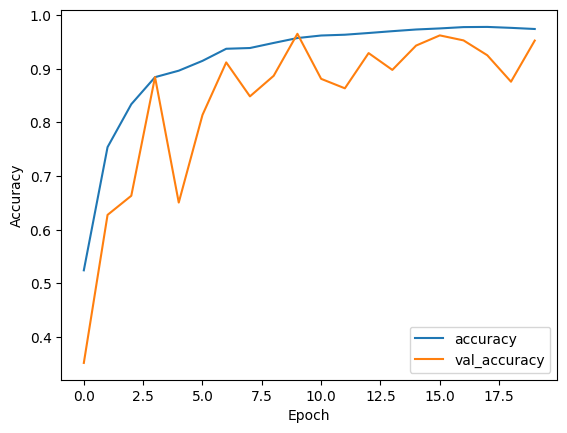

In [15]:
# Visualize training history for the custom model
plt.plot(training_history_custom.history['accuracy'], label='accuracy')
plt.plot(training_history_custom.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

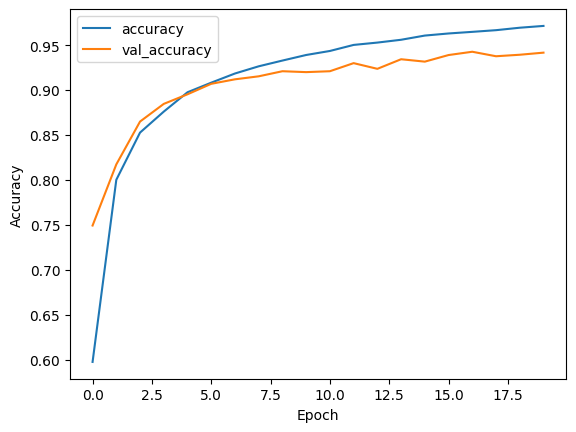

In [16]:
# Visualize training history for the transfer learning model
plt.plot(training_history_transfer_learning.history['accuracy'], label='accuracy')
plt.plot(training_history_transfer_learning.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Test Best Models and Illustrate Results

In [22]:
# Load test data
test_dir='Vegetable Images/test'
test_ds = image_dataset_from_directory(
    test_dir,
    label_mode='categorical',
    image_size = IMAGE_SIZE,
    batch_size = batch_size,
)

# Evaluate the custom model on the test dataset
test_loss_custom, test_accuracy_custom = custom_model.evaluate(test_ds)
print("Custom Model - Test Loss:", test_loss_custom)
print("Custom Model - Test Accuracy:", test_accuracy_custom)

# Evaluate the transfer learning model on the test dataset
test_loss_transfer_learning, test_accuracy_transfer_learning = transfer_learning_model.evaluate(test_ds)
print("Transfer Learning Model - Test Loss:", test_loss_transfer_learning)
print("Transfer Learning Model - Test Accuracy:", test_accuracy_transfer_learning)


Found 3000 files belonging to 15 classes.
32/32 [==============================] - 2s 73ms/step - loss: 0.1509 - accuracy: 0.9460
Custom Model - Test Loss: 0.1509210765361786
Custom Model - Test Accuracy: 0.9459999799728394
32/32 [==============================] - 3s 83ms/step - loss: 0.2051 - accuracy: 0.9410
Transfer Learning Model - Test Loss: 0.205088272690773
Transfer Learning Model - Test Accuracy: 0.9409999847412109


3/3 [==============================] - 0s 28ms/step


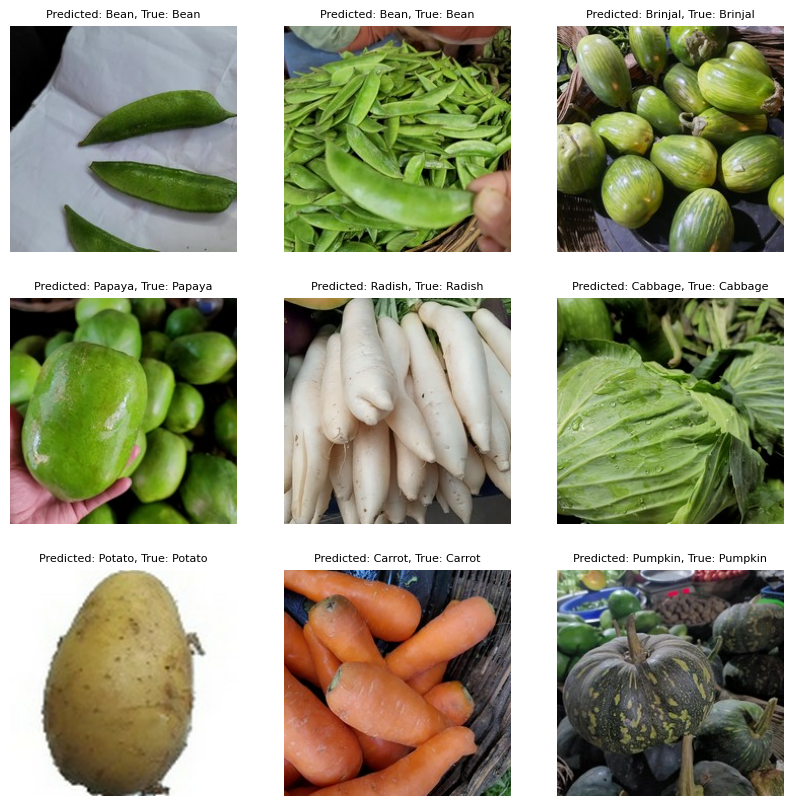

In [24]:
# Visualize test images with predicted and true labels for the custom model
plt.figure(figsize=(10, 10))
for images, labels in test_ds.take(1):
    predictions_custom = custom_model.predict(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_label_custom = train_ds.class_names[np.argmax(predictions_custom[i])]
        true_label = train_ds.class_names[np.argmax(labels[i])]
        plt.title(f'Predicted: {predicted_label_custom}, True: {true_label}', fontsize=8)
        plt.axis("off")
plt.show()

# Explanation

**Input Layer:** Our custom model starts with an Input layer specifying the input shape, which is determined by IMAGE_SIZE.

**Data Augmentation:** We applied a data_augmentation layer to help improve model generalization by applying random transformations to the input images during training.

**Convolutional Layers and Global Average Pooling:** We added 2 layers of convolution layers and GlobalAveragePooling2D to transform the input image in order to extract features from it.

**MaxPooling Layers:** We used MaxPooling2D layers to downsample the feature maps, reducing their spatial dimensions while retaining important information.

**Batch Normalization:** We added a BatchNormalization layer to stabilize and accelerate training by normalizing the activations.

**Fully Connected Layers:** We used two Dense layers with 512 units each and ReLU activation functions, followed by a Dropout layer with a dropout rate of 0.5 to prevent overfitting.

**Output Layer:** The final Dense layer produces the output predictions and uses a softmax activation function to output class probabilities.

**Switch:** We used a boolean variable to control whether to load pre-trained weights (True) or train the models from scratch (False).

If **LOAD_WEIGHTS** is **False**, the code trains the models from scratch. It fits the models to the training data (train_ds) and validates them using the validation data (val_ds). The training is performed for 20 epochs, and TensorBoard callbacks (tensorboard_callback_custom and tensorboard_callback_transfer) are used for monitoring.

**Saving Weights:** After training, the code saves the weights of both models to files (custom_model_weights.h5 and transfer_learning_model_weights.h5) for future use.

**Pre-trained MobileNetV2 model:** We utilized a pre-trained MobileNetV2 model, which has been trained on a large dataset (ImageNet) to improve performance of our custom_mode




